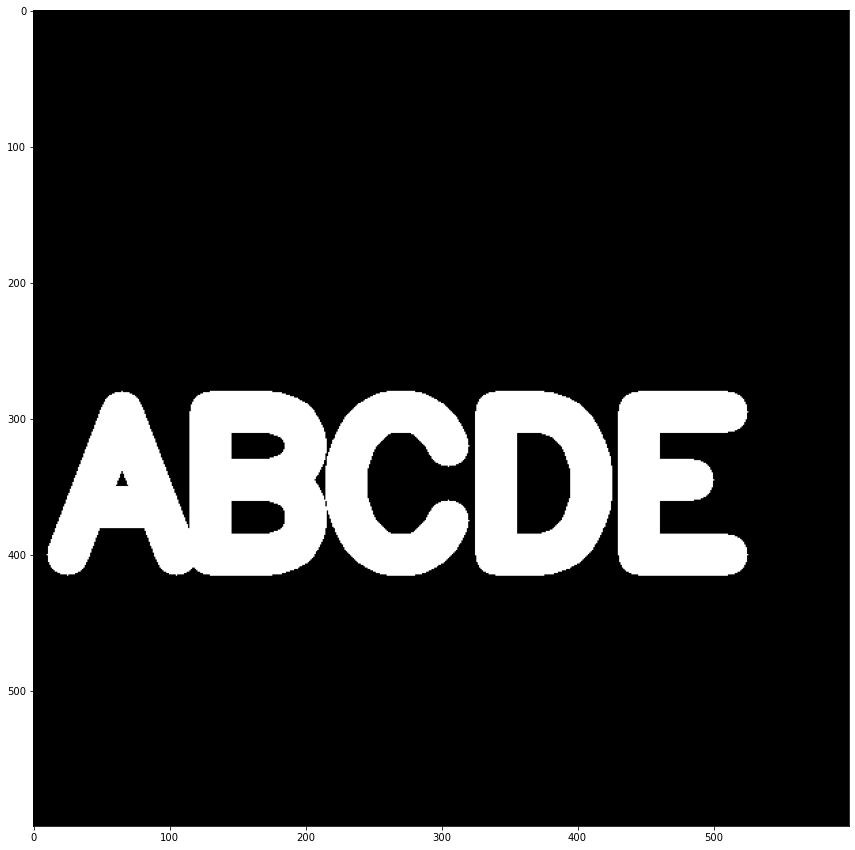

In [18]:
# Class 5 Morphological Operators
# MO are sets of kernels that can achienve a variety of effects such as reducing noise
# Certain operators are very good at reducing black points on a white background
# Certain operators can also achieve an erosion and dilation effect that can add or erode from an existing image
# This effect is mostly seen on text data, so we will practisce various morphological operators on some simple white text on a balck background.

def load_img():
    blank_img = np.zeros((600,600))
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(blank_img,text='ABCDE',org=(20,400),fontFace = font,
               fontScale = 5,color= (255,255,255),thickness = 30)
    return blank_img
img = load_img()
show_img(img)

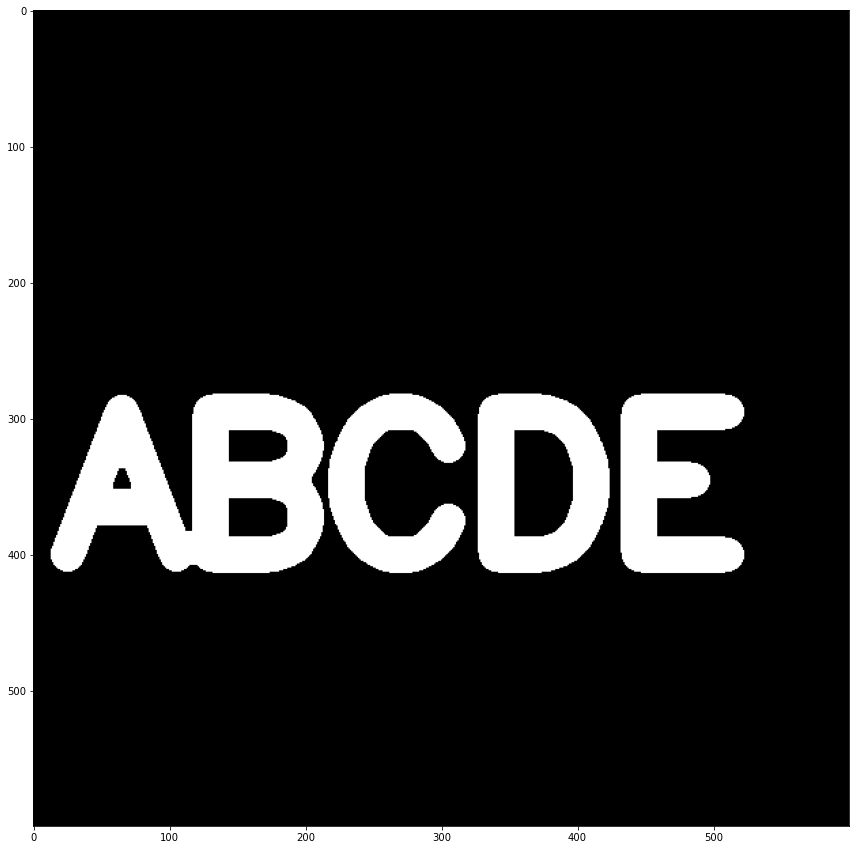

In [19]:
# Syntax: cv2.erode(src, kernel[, dst[, anchor[, iterations[, borderType[, borderValue]]]]])
# Parameters:
# src: It is the image which is to be eroded .
# kernel: A structuring element used for erosion. If element = Mat(), a 3 x 3 rectangular structuring element is used. Kernel can be created using getStructuringElement.
# dst: It is the output image of the same size and type as src.
# anchor: It is a variable of type integer representing anchor point and it’s default value Point is (-1, -1) which means that the anchor is at the kernel center.
# borderType: It depicts what kind of border to be added. It is defined by flags like cv2.BORDER_CONSTANT, cv2.BORDER_REFLECT, etc.
# iterations: It is number of times erosion is applied.
# borderValue: It is border value in case of a constant border.
# Return Value: It returns an image.show_img(img)

kernel = np.ones((5,5),dtype=np.uint8)
result = cv2.erode(img,kernel,iterations = 1)
show_img(result)

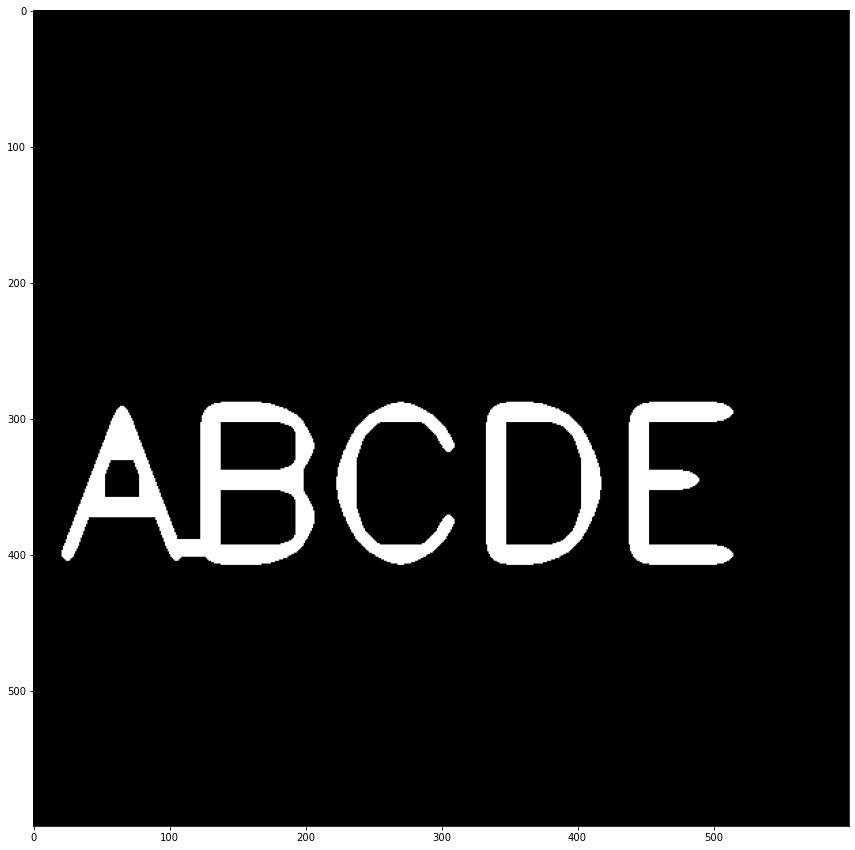

In [20]:
result = cv2.erode(img,kernel,iterations = 4)
show_img(result)

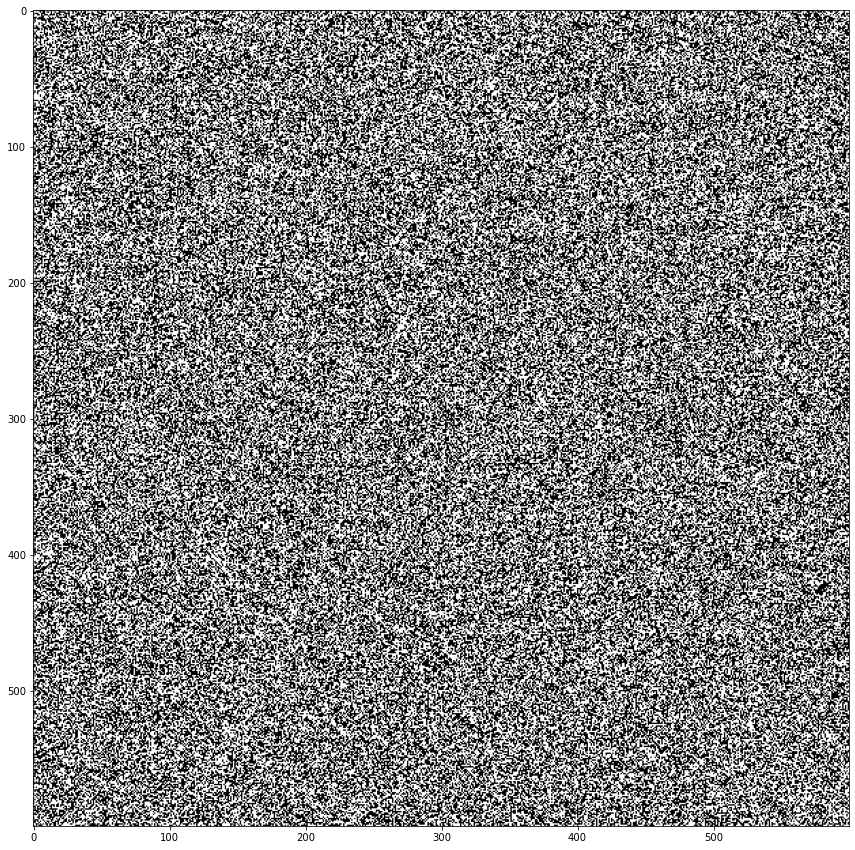

In [21]:
img = load_img()
#creating white noise
white_noise = np.random.randint(0,2,size=(600,600))
show_img(white_noise)

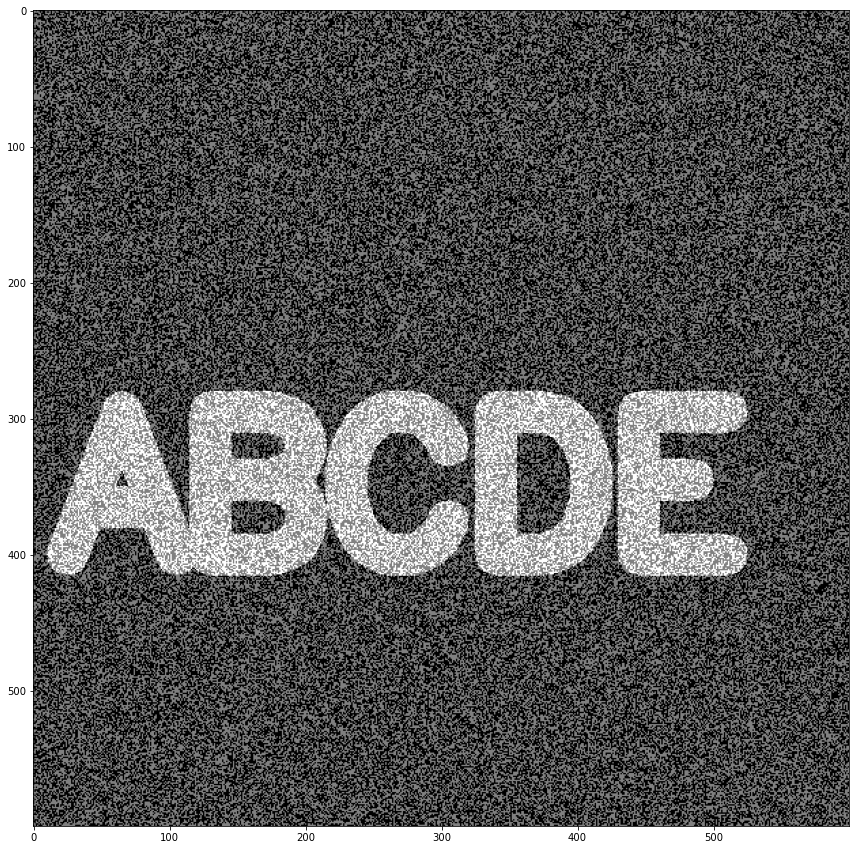

In [22]:
white_noise = white_noise * 255
noise_img = white_noise + img
show_img(noise_img)

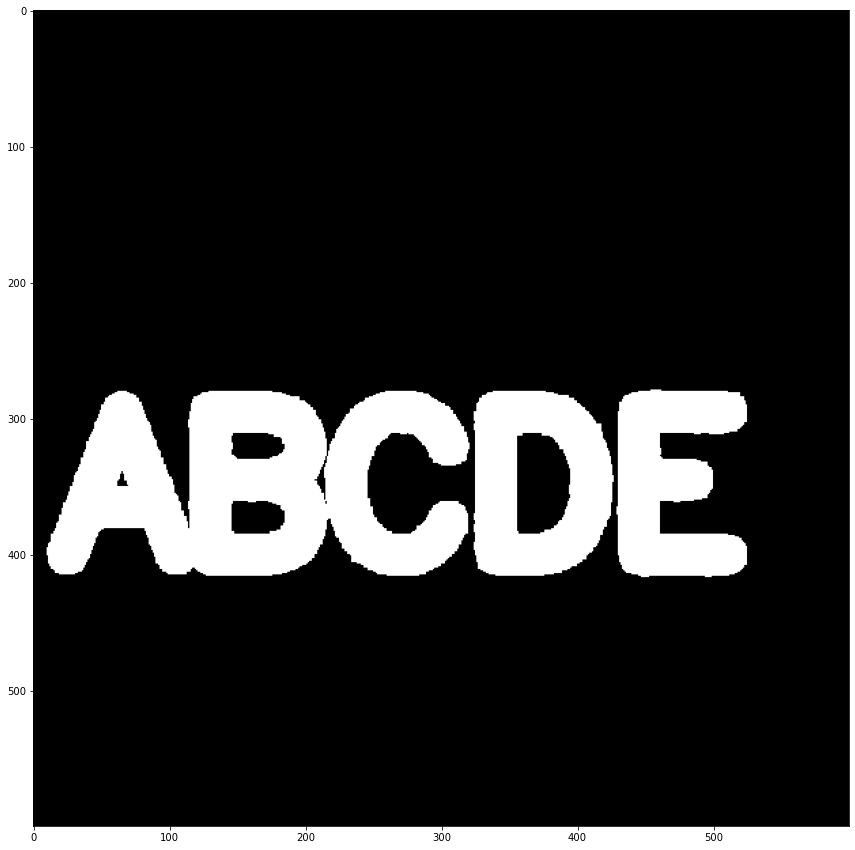

In [23]:
# opening is used to clean up the noise
opening = cv2.morphologyEx(noise_img,cv2.MORPH_OPEN,kernel)
show_img(opening)

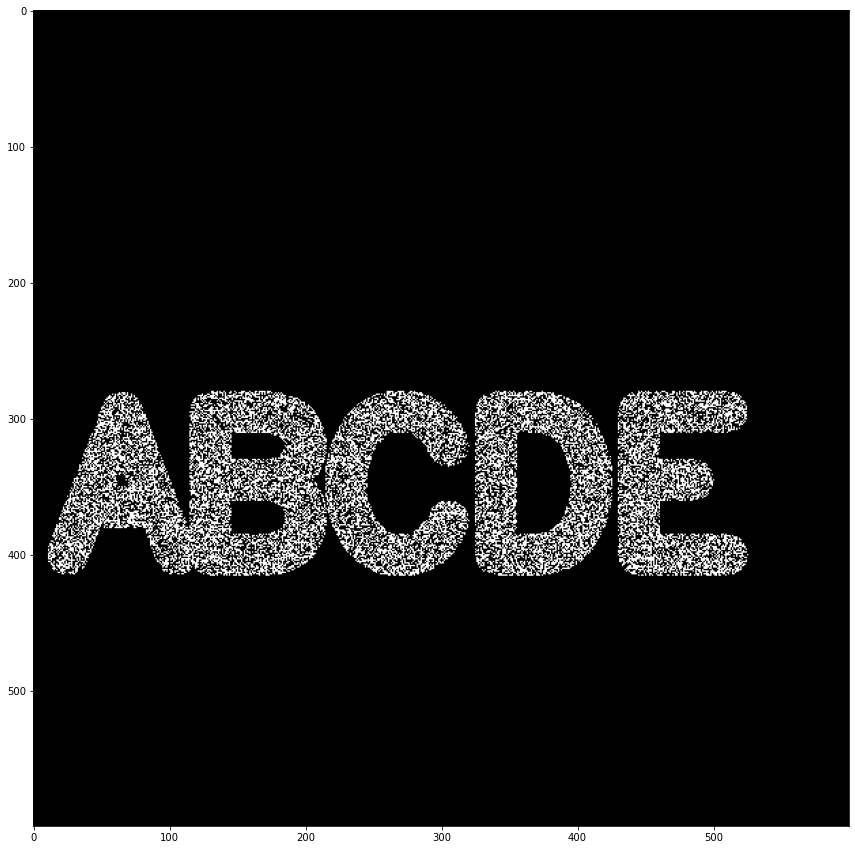

In [24]:
img = load_img()
black_noise = np.random.randint(0,2,(600,600))
black_noise = black_noise * -255
black_noise = black_noise + img
black_noise[black_noise==-255] =0
show_img(black_noise)

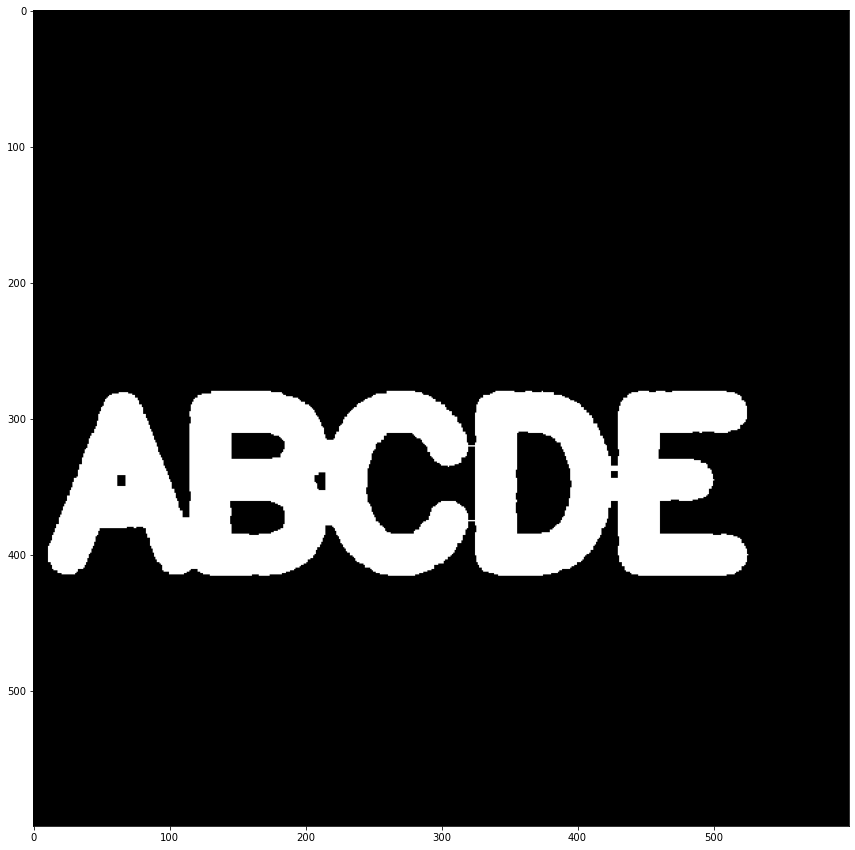

In [25]:
closing = cv2.morphologyEx(black_noise,cv2.MORPH_CLOSE,kernel)
show_img(closing)

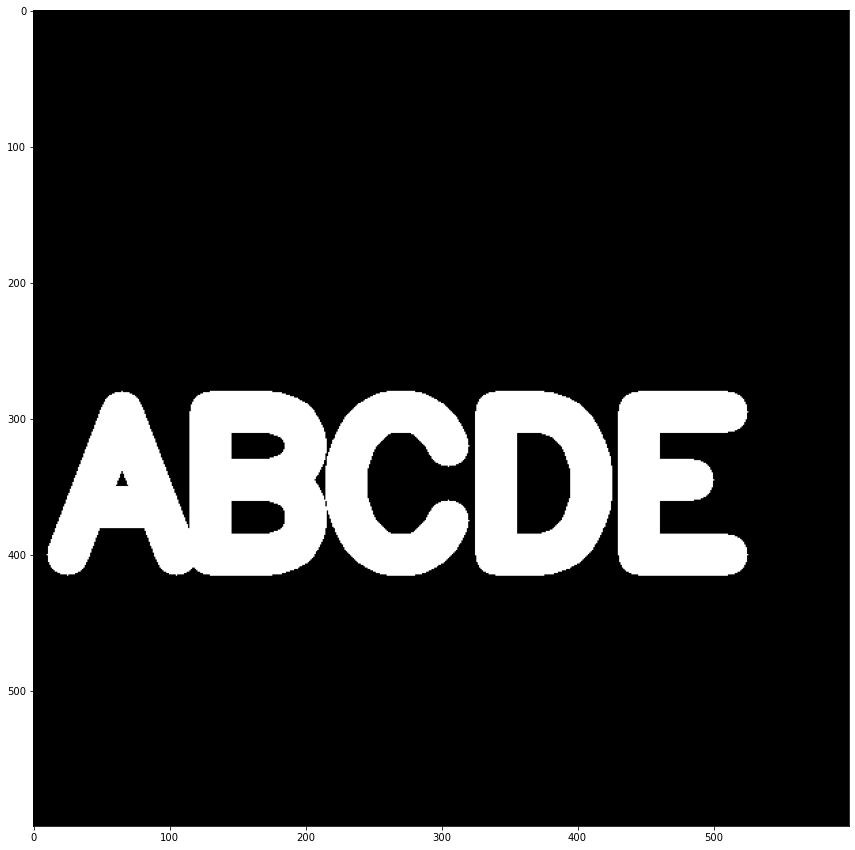

In [26]:
img = load_img()
show_img(img)

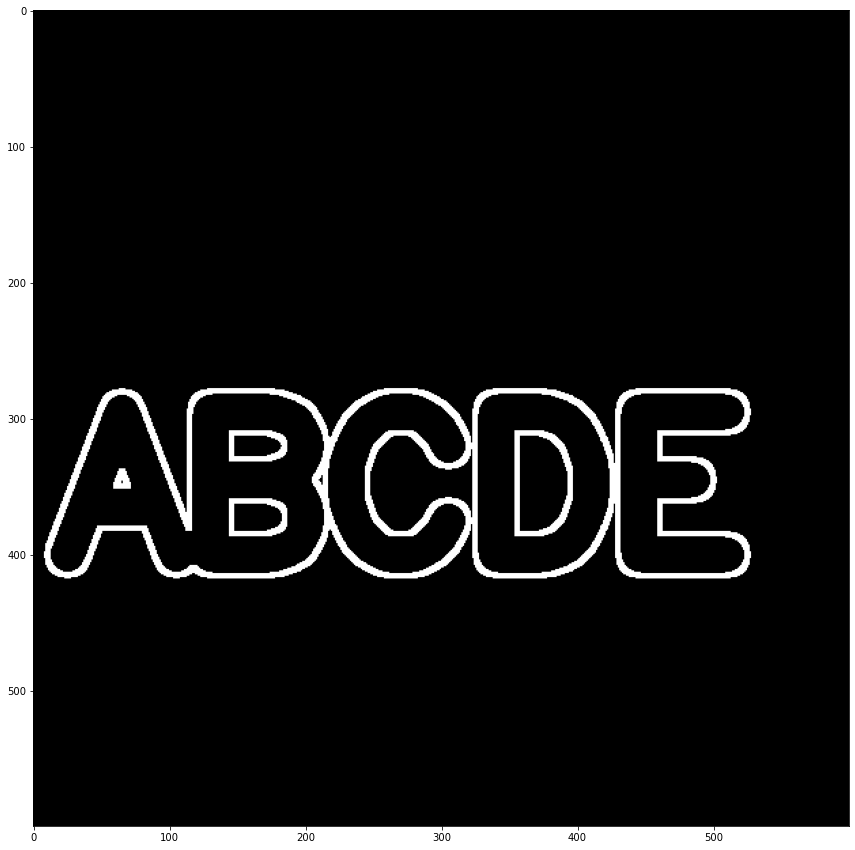

In [27]:
gradient = cv2.morphologyEx(img,cv2.MORPH_GRADIENT,kernel)
show_img(gradient)
#thisis the difference between erosion and dialation

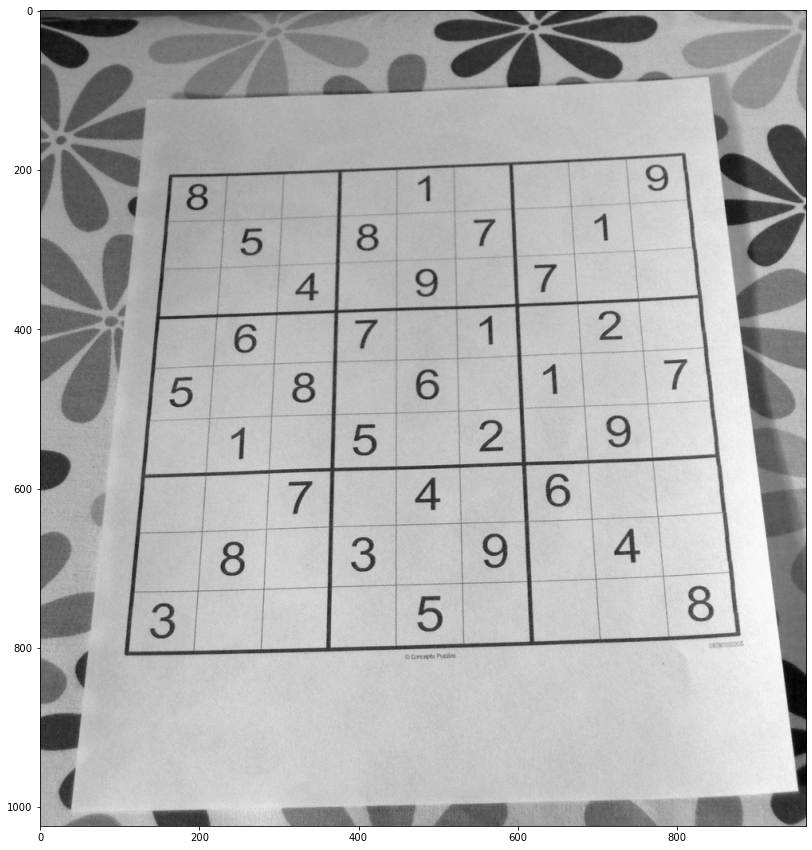

In [28]:
# Class 6 - Gradient
# An image gradient is a directional change in the intensity or color in an image
# Gradients can be calculated in a specific direction

img =cv2.imread('C:/Users/vasukisriram/Downloads/Python OpenCV DL # DATA GH/Data/sudoku.jpg',0)
show_img(img)

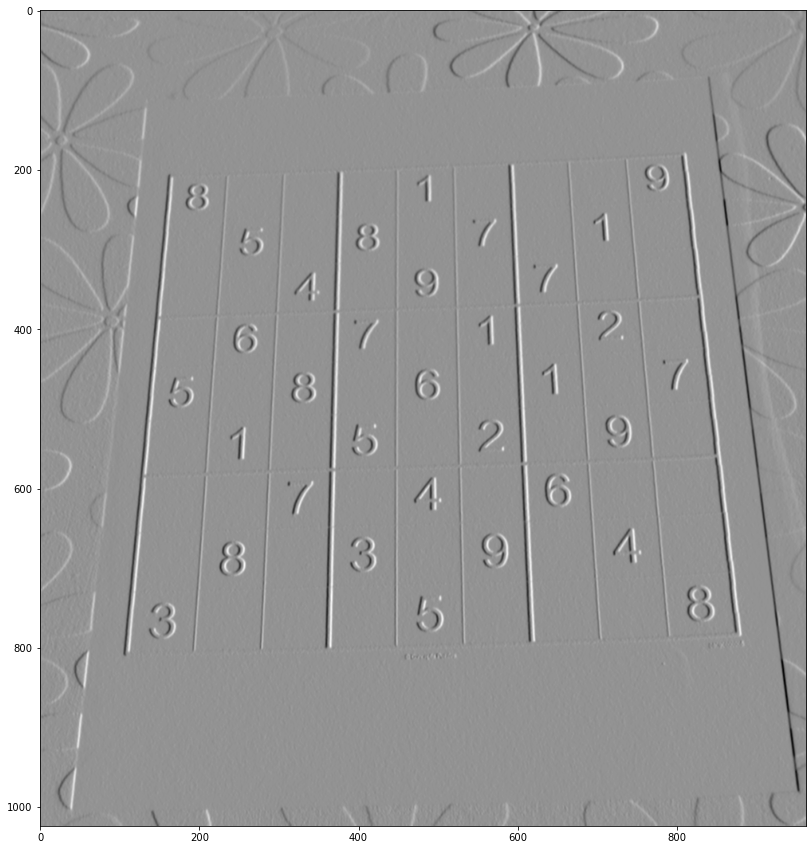

In [29]:
sobelx = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=5)
show_img(sobelx)

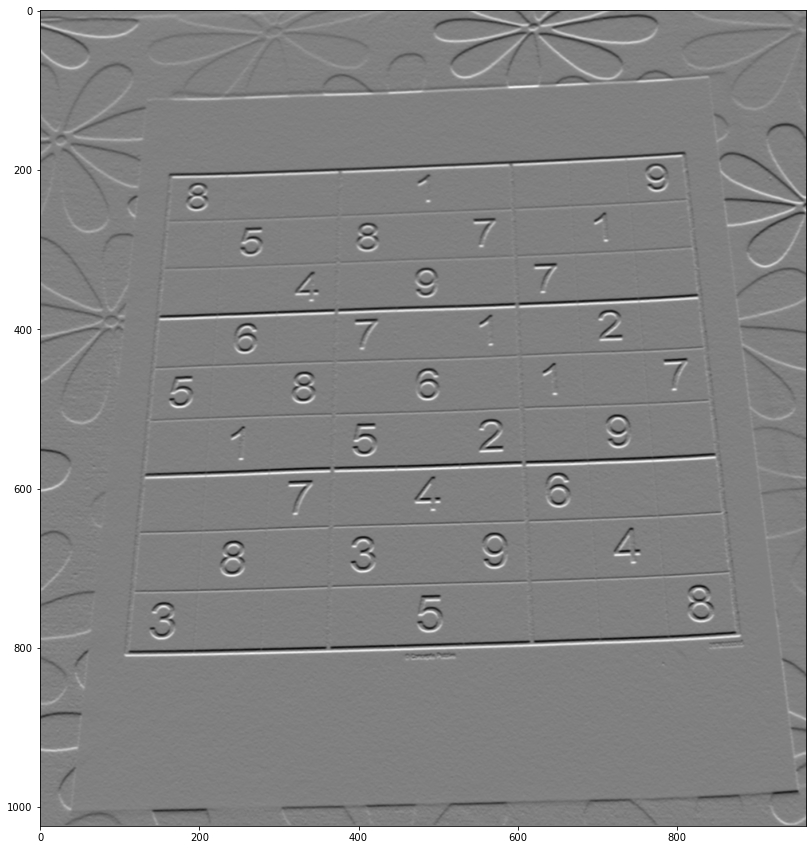

In [30]:
sobely = cv2.Sobel(img,cv2.CV_64F,0,1,ksize=5)
show_img(sobely)

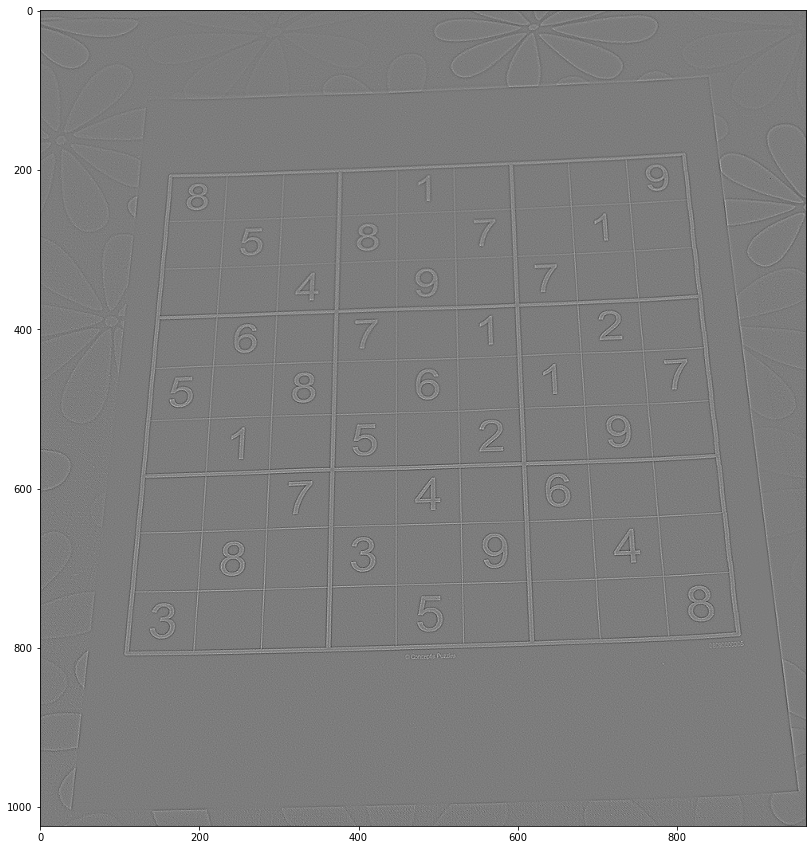

In [31]:
laplacian = cv2.Laplacian(img,cv2.CV_64F)
show_img(laplacian)

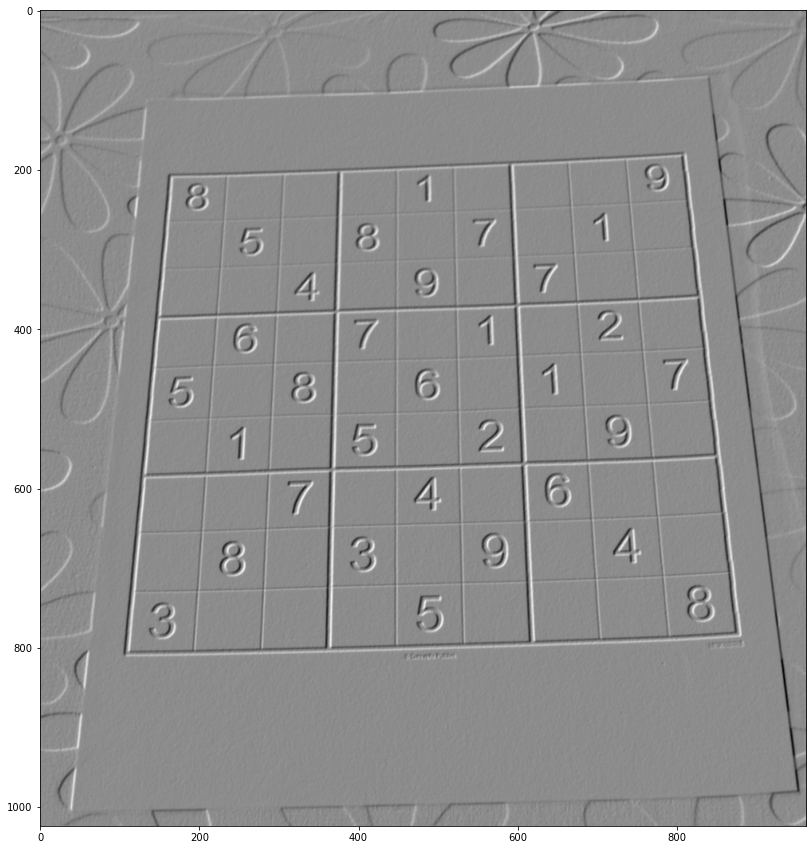

In [32]:
blended = cv2.addWeighted(sobelx,0.6,sobely,0.3,0)
show_img(blended)

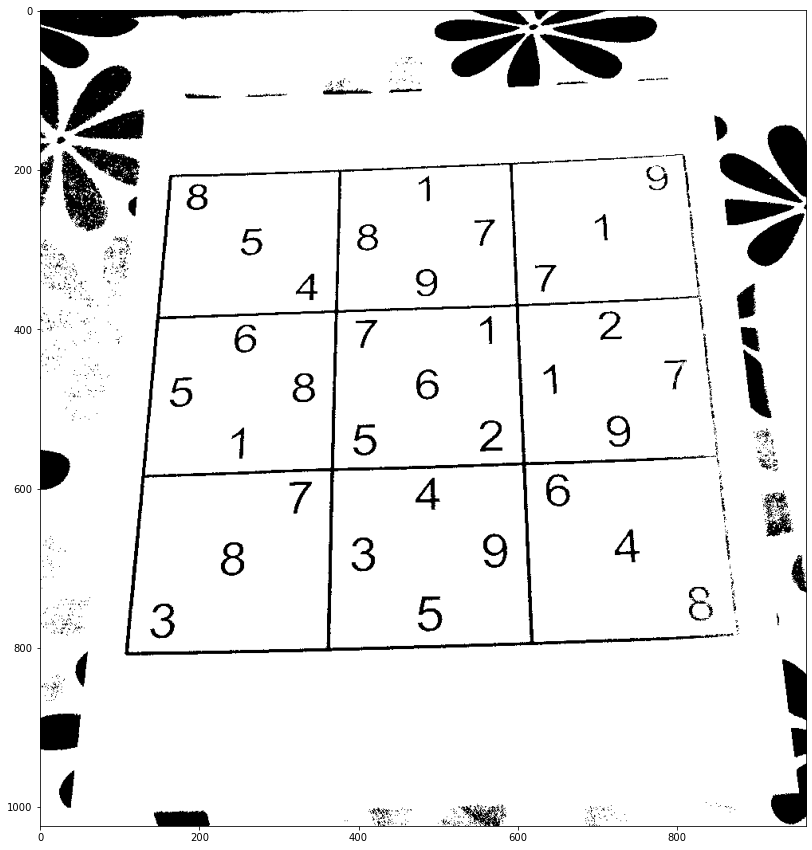

In [33]:
ret,thr = cv2.threshold(img,100,255,cv2.THRESH_BINARY)
show_img(thr)

In [34]:
# Class 7 - Histograms
# Histogram is the visual representation of the distribution of a continous feature

dark_horse = cv2.imread('C:/Users/vasukisriram/Downloads/Python OpenCV DL # DATA GH/Data/horse.jpg') #for opencv
show_horse = cv2.cvtColor(dark_horse,cv2.COLOR_BGR2RGB) # for matplotlib

In [35]:
rainbow = cv2.imread('C:/Users/vasukisriram/Downloads/Python OpenCV DL # DATA GH/Data/rainbow.jpg')
show_rainbow = cv2.cvtColor(rainbow,cv2.COLOR_BGR2RGB)

In [36]:
bricks = cv2.imread('C:/Users/vasukisriram/Downloads/Python OpenCV DL # DATA GH/Data/bricks.jpg')
show_bricks = cv2.cvtColor(bricks,cv2.COLOR_BGR2RGB)

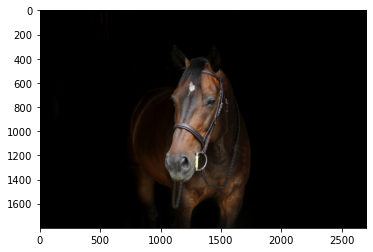

In [37]:
plt.imshow(show_horse)

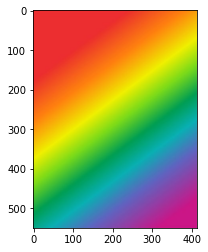

In [38]:
plt.imshow(show_rainbow)

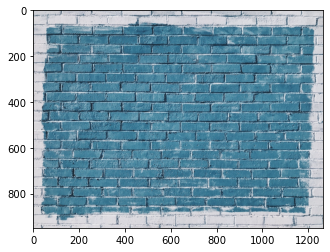

In [39]:
plt.imshow(show_bricks)

In [40]:
hist_values = cv2.calcHist([bricks],channels=[0],mask=None,
             histSize=[256],ranges=[0,256])
hist_values.shape

(256, 1)

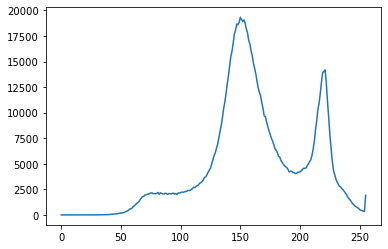

In [41]:
plt.plot(hist_values)

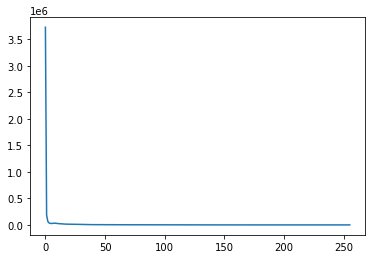

In [42]:
hist_values = cv2.calcHist([dark_horse],channels=[0],mask=None,
             histSize=[256],ranges=[0,256])
plt.plot(hist_values)

Text(0.5, 1.0, 'Histogram of Blue bricks')

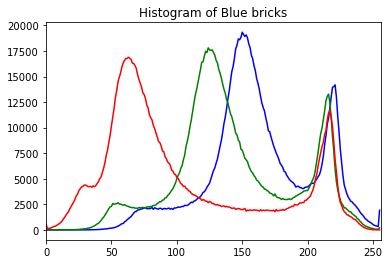

In [43]:
img = bricks
color = ('b','g','r')

for i,col in enumerate(color):
    histr = cv2.calcHist([img],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
plt.title('Histogram of Blue bricks')

In [44]:
# Histogram Equalization
# Is a method of contrast adjustment based on the image's histogram
# Making the cumulative histogram much more linear... means you are increasing the contrast of an image

img = rainbow
img.shape

(550, 413, 3)

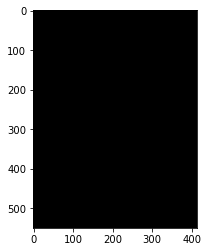

In [45]:
#creating mask
mask = np.zeros(img.shape[:2],np.uint8)
plt.imshow(mask,cmap='gray')

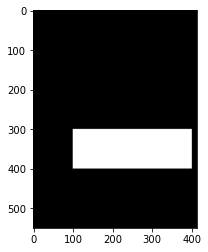

In [46]:
mask[300:400,100:400] = 255
plt.imshow(mask,cmap = 'gray')

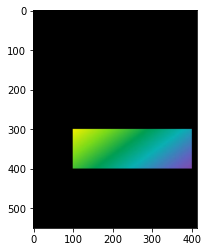

In [47]:
masked_img = cv2.bitwise_and(img,img,mask=mask)
show_masked_img = cv2.bitwise_and(show_rainbow,show_rainbow,mask = mask)
plt.imshow(show_masked_img)

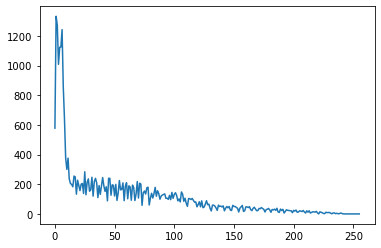

In [48]:
hist_mask_values_red = cv2.calcHist([rainbow],[2],mask,[256],[0,256])
plt.plot(hist_mask_values_red)

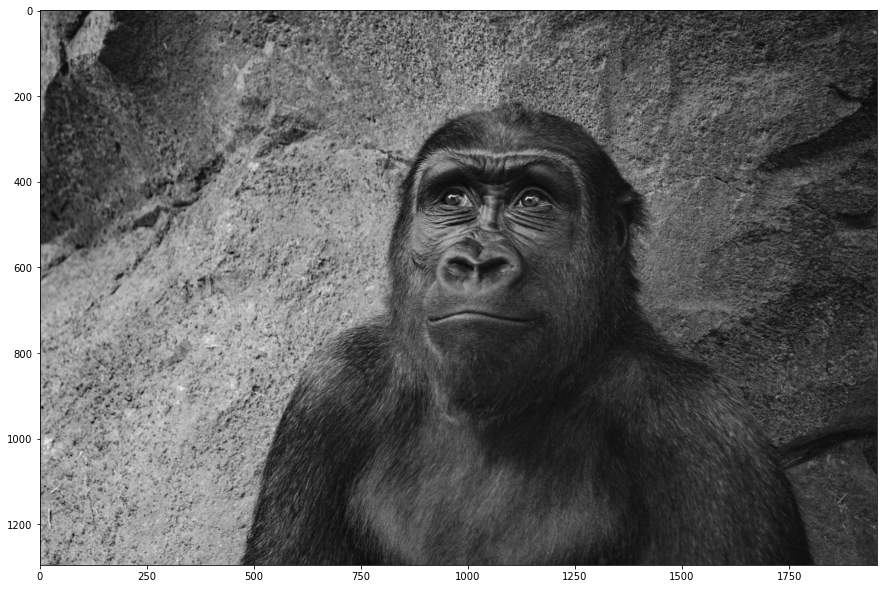

In [49]:
gorilla = cv2.imread('C:/Users/vasukisriram/Downloads/Python OpenCV DL # DATA GH/Data/gorilla.jpg',0)
show_img(gorilla)

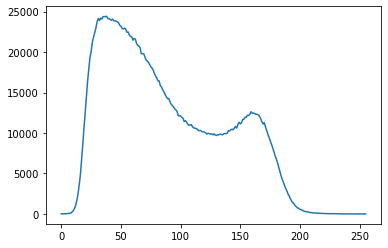

In [50]:
hist_values = cv2.calcHist([gorilla],[0],mask=None,histSize=[256],ranges=[0,256])
plt.plot(hist_values)

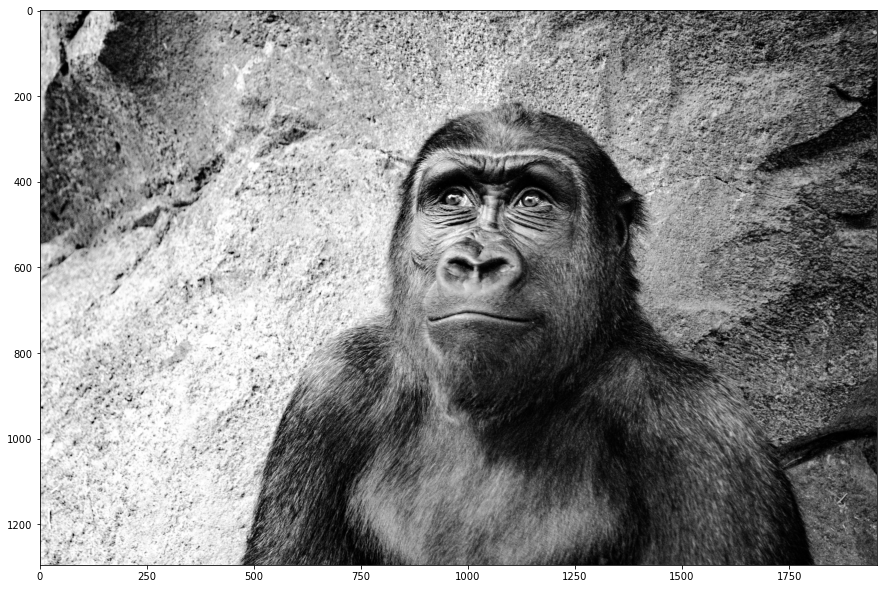

In [51]:
eq_gorilla = cv2.equalizeHist(gorilla)
show_img(eq_gorilla)

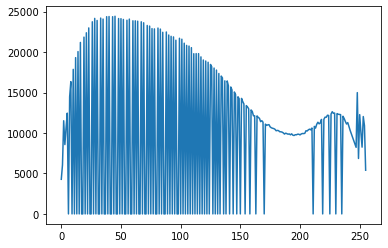

In [52]:
hist_values = cv2.calcHist([eq_gorilla],[0],mask=None,histSize=[256],ranges=[0,256])
plt.plot(hist_values)

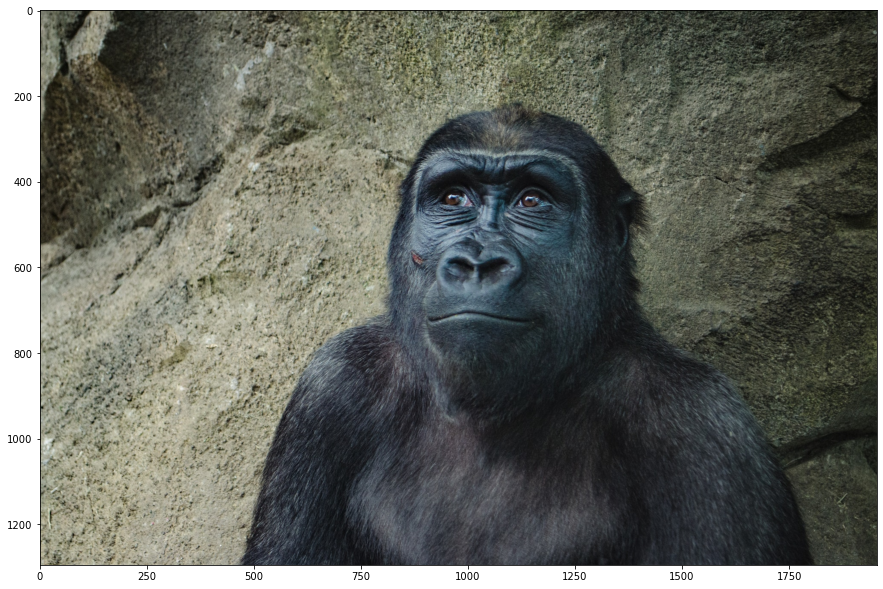

In [53]:
color_gorilla = cv2.imread('C:/Users/vasukisriram/Downloads/Python OpenCV DL # DATA GH/Data/gorilla.jpg')
show_gorilla = cv2.cvtColor(color_gorilla,cv2.COLOR_BGR2RGB)
show_img(show_gorilla)

In [54]:
hsv = cv2.cvtColor(color_gorilla,cv2.COLOR_BGR2HSV)
hsv[:,:,2].min()

1

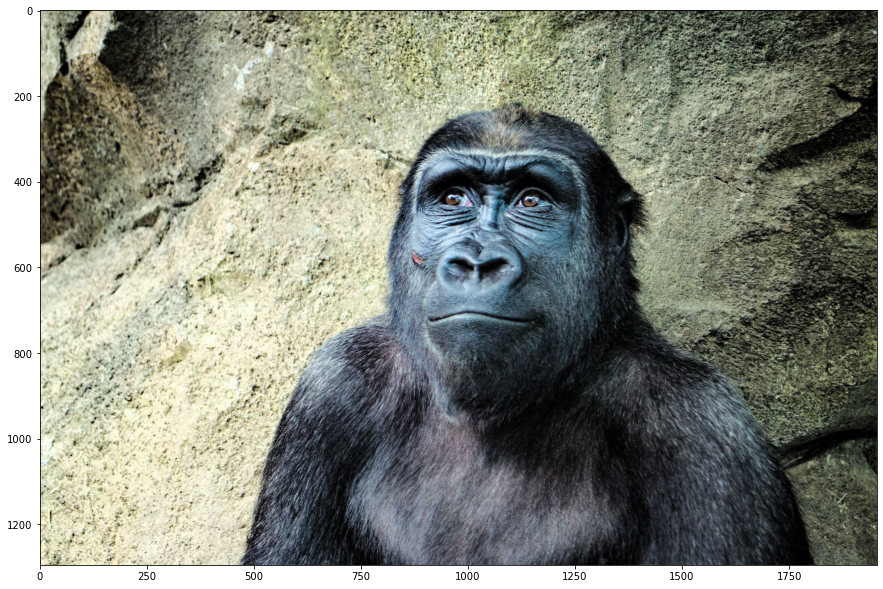

In [55]:
hsv[:,:,2] = cv2.equalizeHist(hsv[:,:,2])
eq_color_gorilla = cv2.cvtColor(hsv,cv2.COLOR_HSV2RGB)
show_img(eq_color_gorilla)

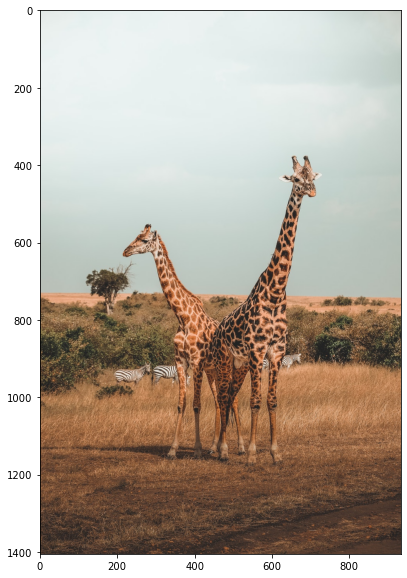

In [56]:
### Image Processing Assessment

import cv2
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

def display_img(img,cmap=None):
    fig = plt.figure(figsize=(12,10))
    ax = fig.add_subplot(111)
    ax.imshow(img,cmap)
    
img = cv2.imread('C:/Users/vasukisriram/Downloads/Python OpenCV DL # DATA GH/Data/giraffes.jpg')
show_img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
display_img(show_img)

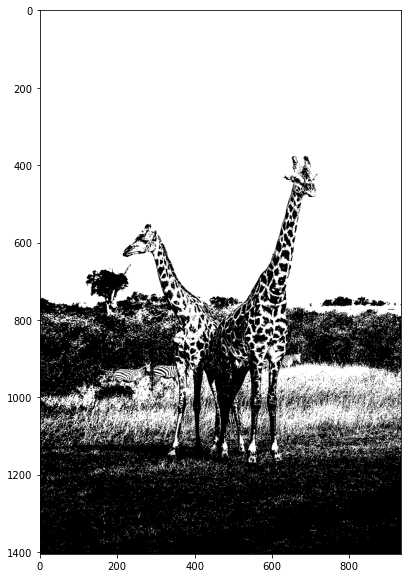

In [57]:
img_gray = cv2.imread('C:/Users/vasukisriram/Downloads/Python OpenCV DL # DATA GH/Data/giraffes.jpg',0)
ret,thr1 = cv2.threshold(img_gray,127,255,type = cv2.THRESH_BINARY)
display_img(thr1,cmap='gray')

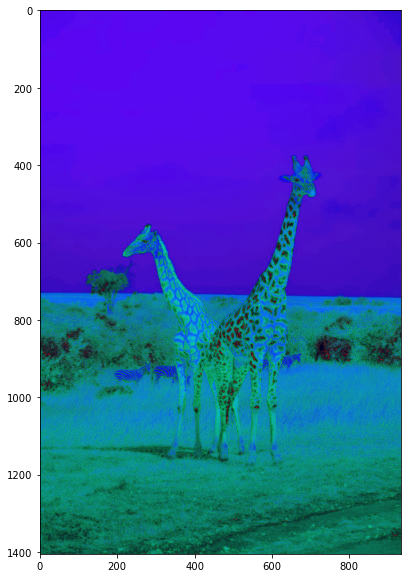

In [58]:
hsv_img = cv2.cvtColor(img,cv2.COLOR_BGR2HSV)
display_img(hsv_img)

In [59]:
kernel = np.ones((4,4),dtype=np.float32)
kernel = kernel * 1/10
kernel

array([[0.1, 0.1, 0.1, 0.1],
       [0.1, 0.1, 0.1, 0.1],
       [0.1, 0.1, 0.1, 0.1],
       [0.1, 0.1, 0.1, 0.1]], dtype=float32)

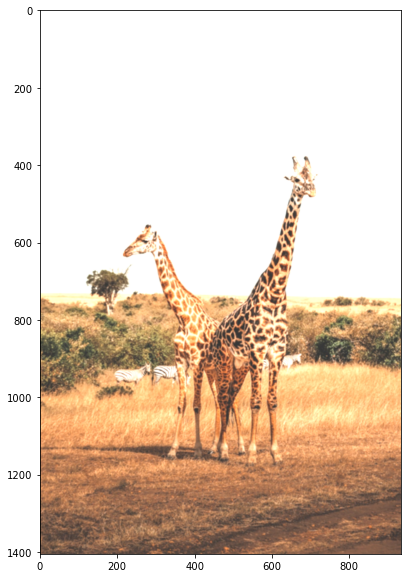

In [60]:
blurred = cv2.filter2D(show_img,-1,kernel)
display_img(blurred)

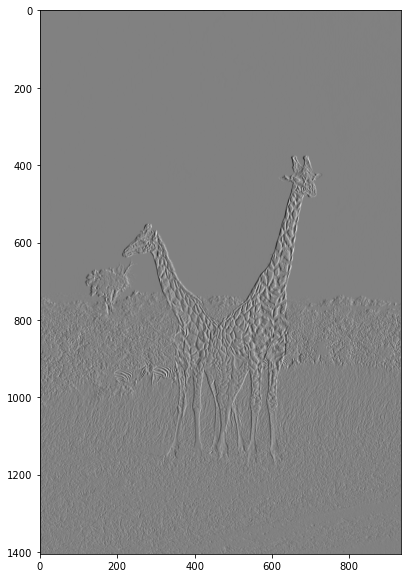

In [61]:
sobelx = cv2.Sobel(img_gray,cv2.CV_64F,1,0,ksize=5)
display_img(sobelx,'gray')

Text(0.5, 1.0, 'Giraffes Histograms')

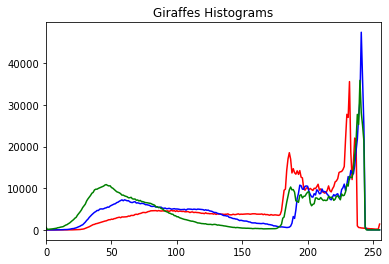

In [62]:
color = ['r','b','g']

for i,col in enumerate(color):
    histr = cv2.calcHist([show_img],[i],None,[256],[0,256])
    plt.plot(histr,color=col)
    plt.xlim([0,256])
plt.title('Giraffes Histograms')